In [1]:
# ! pip install sentence-transformers
# ! pip install tensorflow
# ! conda install nomkl
# import os
# os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [1]:
import pandas as pd
from collections import Counter
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
import gensim
from gensim.models import Word2Vec
import gensim.downloader as api
import numpy as np
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from imblearn.over_sampling import RandomOverSampler 
from imblearn.under_sampling import RandomUnderSampler 
import seaborn as sns
sns.set_theme(style="whitegrid")

# from keras.layers.convolutional import Conv1D
# from keras.layers.convolutional import MaxPooling1D
# from keras.layers.embeddings import Embedding
# from keras.preprocessing import sequence


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/brijpatel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
from imblearn.over_sampling import SMOTE
import plotly.express as px
from sklearn.decomposition import PCA
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import KMeansSMOTE
from imblearn.over_sampling import SVMSMOTE 
from imblearn.over_sampling import ADASYN 
from imblearn.over_sampling import SMOTENC
from sentence_transformers import SentenceTransformer
from tqdm import tqdm


In [ ]:
# !pip install tensorflow
from tensorflow.keras.models import Sequential

In [ ]:
from tensorflow.keras.layers import Conv2D, Flatten, Dense

In [ ]:
from tensorflow.keras.layers import Embedding, Conv1D,MaxPooling1D

In [ ]:
from tensorflow.keras.layers import Dropout,MaxPool1D,GlobalMaxPool1D,Activation

In [65]:
'''
TODO : 

1) [DONE] Importance of SF, LF and EF in the dataframe for both the balance and unbalance dataset.
2) Lemmatize and Stemmatize to checkout the words that have been discarded from google news 300 dataset because 
   of not getting in the dictionary
3) [DONE]SF is considered as one of the strong factors in deciding whether the sentence is claim or not. So I would
like to experiment whether instead of only marking the start and ending of paragraph as 1 why not to also
consider paragraph ending and beginning as SF 1.
4) Experiment the original LF, instead of keeping it counter keep it binary and see if it improves or degrades
5) Overpower the unigrams, so if they are occuring once, multiply them x5
6) Change the embedings from non contextual to contextual and see the difference.
7) Implement 3 DL approaches as done in the previous work
8) Change the test propotion to 0.1

'''

'\nTODO : \n\n1) [DONE] Importance of SF, LF and EF in the dataframe for both the balance and unbalance dataset.\n2) Lemmatize and Stemmatize to checkout the words that have been discarded from google news 300 dataset because \n   of not getting in the dictionary\n3) [DONE]SF is considered as one of the strong factors in deciding whether the sentence is claim or not. So I would\nlike to experiment whether instead of only marking the start and ending of paragraph as 1 why not to also\nconsider paragraph ending and beginning as SF 1.\n4) Experiment the original LF, instead of keeping it counter keep it binary and see if it improves or degrades\n\n'

## Argument Annonated Essays : Data Parsing

In [ ]:
'''
T[1-9] not in order, get value through keys so no sentence is left unread
Initial Mistake : To consider length and order it sequentially,
New Method : To get the keys and order it according to the keys


Count differs with what in the original paper
Original : 2108
New Count : 2257

Define Premise :  a statement or idea taken to be true and on which an argument or reasoning may be based.
Define Claim and Non Claim
'''
from brat_parser import get_entities_relations_attributes_groups
text = []
type_text = []
for i in range(1,403):
    if i < 10:entities, relations, attributes, groups = get_entities_relations_attributes_groups("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay00"+str(i)+".ann")
    elif i < 100:entities, relations, attributes, groups = get_entities_relations_attributes_groups("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay0"+str(i)+".ann")
    elif i < 500:entities, relations, attributes, groups = get_entities_relations_attributes_groups("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay"+str(i)+".ann")
#     length = len(entities)
    keys = list(entities.keys())
    for key in keys:
        metadata = entities[key]
        text.append(metadata.text)
        type_text.append(metadata.type)
        

In [ ]:
print(len(text),len(type_text))

In [ ]:
df = pd.DataFrame()
df['text'] = text
df['type'] = type_text
df.to_csv('processed_dataset/argument_annonated_essays')

In [ ]:
df['type'].value_counts()

In [2]:
df = pd.read_csv('processed_dataset/argument_annonated_essays')
df.head()

,Unnamed: 0,text,type
0,0,we should attach more importance to cooperatio...,MajorClaim
1,1,a more cooperative attitudes towards life is m...,MajorClaim
2,2,"through cooperation, children can learn about ...",Claim
3,3,What we acquired from team work is not only ho...,Premise
4,4,"During the process of cooperation, children ca...",Premise


## Web Discourse Dataset/ Topic Specific Dataset

Premise       3832
Claim         1506
MajorClaim     751
Name: type, dtype: int64


<AxesSubplot:xlabel='type', ylabel='count'>

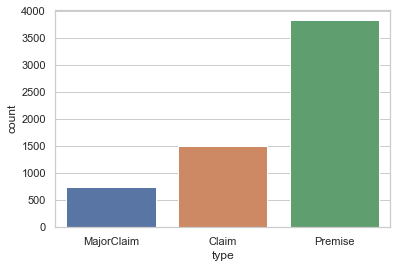

In [3]:
print(df['type'].value_counts())
sns.countplot(x=df['type'])

## Methodology - Persuasive Essay

Prevous Approach :

Pre-processing : Sentence Tokenization
Methodology : 
    ML : L2 Logistic Regression
    DL : SOTA
    
    
Previous Work Statement : setting.
To address class-imbalance in our datasets (see
Table 1), we downsample the negative class (nonclaim)
both in-domain and cross-domain, so that
positive and negative class occur approximately in
an 1:1 ratio in the training data.


Interesting Modification:

Structure Feature:
    - position (binary which states whether it is first or last)
    - length of the sentence
    - count number of punctuations
    
Lexical Features:
    - [TODO] Make a list of 4000 unigrams from the claims and major claims

Emgedding Features:
    - trained 300 dimensional googlenews word embeddings


## Lexical Feature :  Extracting the 4000 most frequent unigrams from claims

In [7]:
'''
1st Method : To extract the stop words, intial thought process was to just count the words and 
sort them in decresing order of the count. But it lead to some non related words in the most 
frequent order for example : the, to, and, of, a etc.



2nd Method : To improve on the methodology, I removed the stop words and tried again to see if I get more relevant
words in the most frequent list, but I still got words like people, students, life etc

3rd Method : Was to use POS tagging and only extract the words falling in the cateogory of MD (model) 
[would, should, could], VB(verb) [because], NN (noun)[hence], RB (adverb)[thus, therefore]. 

An improvement, can be to instead of just making a binary column indicating whether the sentence contains 
a unigram or not. We can make it a count column indicating the count of the targetted words.

UPDATE : To calculate the impact of LF in the final ML model, as we have shifted our focus from a binary variable to
a counter variable. I have normalized the LF column to make it equivalent to the embeddings.

The maximum number of unigrams a claims has is 10.

'''

claimSentence = list(df[(df['type'] == "MajorClaim")|(df['type'] == "Claim")]['text'].values)
claimSentence = ' '.join(claimSentence)
claimSentence = claimSentence.split()
allowed_POS = ['MD','VB','NN','RB']
claimSentence_POS = nltk.pos_tag(claimSentence)
claimWords = []
for word,pos in claimSentence_POS:
    if pos in allowed_POS:claimWords.append(word)
wordCount =Counter(claimWords)
most_occur = wordCount.most_common(15)
most_occur_words = []
for word, count in most_occur:
    most_occur_words.append(word)
text = list(df['text'].values)
is_unigram = []
for index in range(len(text)):
    word_text = text[index].split(' ')
    counter = 0
    for word in word_text:
        if word.lower() in most_occur_words:
            counter+=1
    is_unigram.append(counter)
df['LF'] = is_unigram
column = 'LF'
df[column] = (df[column] - df[column].min()) / (df[column].max() - df[column].min())    
df.head()

,Unnamed: 0,text,type,LF
0,0,we should attach more importance to cooperatio...,MajorClaim,0.2
1,1,a more cooperative attitudes towards life is m...,MajorClaim,0.1
2,2,"through cooperation, children can learn about ...",Claim,0.2
3,3,What we acquired from team work is not only ho...,Premise,0.2
4,4,"During the process of cooperation, children ca...",Premise,0.1


## Structure Feature : Binary Variable calculating whether the given sentence was the first or last.

In [8]:



'''
Explain the format of the txt file containing the essay, to be more elaborate explain more on how the first line is
a question followed by the essay. 

To finalize the last line, in some of the essays the last line was a null so I have extracted the last 
second line.

Then strip it to remove the extra spaces so that we can match it precisely to our dataframe.
'''

# Read the txt file to get the complete corpus to extract the first and last sentence of the essay.

corner_sentence = []
for i in range(1,403):
    if i < 10:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay00"+str(i)+".txt", "r")
    elif i < 100:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay0"+ str(i) +".txt", "r")
    elif i < 500:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay" +str(i) +".txt", "r")
    data = (' '.join((f.read()).split('\n')[2:])).split('.')
    first = ""
    last = ""
    index = 0 
    while index < len(data) and len(data[index])<=2:index+=1
    first = data[index].strip().lower()
    index = len(data) - 1
    while index >=0 and len(data[index])<=2:index-=1
    last = data[index].strip().lower()
    corner_sentence.append(first)
    corner_sentence.append(last)

df_text = list(df['text'].values)
isEdge = []
for index in range(len(df_text)):
    if df_text[index].lower() in corner_sentence:
        isEdge.append(1)
    else:
        isEdge.append(0)
df['SF'] = isEdge

## Embedding Feature : Trained Google News Embeddings

In [9]:
wv = api.load('word2vec-google-news-300')

In [10]:
'''
Google news does not contain all the word in the persuasive text, if we run the script in total we got a total of
 2070 words missing and 6564 accepted
 
But if we remove the stop words and then embedd the data, we get a total of 645 missing words and 6428 accepted words.

TODO : a future improvement which can be done here is that there are a few words such as "travelling" which are not in
google300 but the root word is in the list so we can lemmatize/stemmatize word to get in the accepted list.
 
 
According to the previous work, they used a simple yet powerful tool for smummarizing the embeddings. They 
summed up all the word embedding in a sentence into one.

Dillema : Should you sum up horizontally or vertically? , at the moment I am doing horizontally.

'''

df_text = list(df['text'].values)
embeddings = []
missingWord = []
acceptedWord = []
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            acceptedWord.append(word.lower())
            matrix.append(wv[word.lower()])
        else:missingWord.append(word.lower())
    embeddings.append(list(np.sum(matrix,axis = 0)))
print(len(list(set(missingWord))),len(list(set(acceptedWord))))
df['EF'] = embeddings


645 6428


In [11]:
df.head()

,Unnamed: 0,text,type,LF,SF,EF
0,0,we should attach more importance to cooperatio...,MajorClaim,0.2,0,"[-0.07519531, 0.34161377, -0.27844238, -0.2448..."
1,1,a more cooperative attitudes towards life is m...,MajorClaim,0.1,0,"[-0.31689453, 0.046966553, -0.336792, 0.755371..."
2,2,"through cooperation, children can learn about ...",Claim,0.2,0,"[-0.21728516, -0.21689606, -0.43206787, 0.9736..."
3,3,What we acquired from team work is not only ho...,Premise,0.2,0,"[-0.21484375, 0.5615845, -0.25897217, 0.992187..."
4,4,"During the process of cooperation, children ca...",Premise,0.1,0,"[-0.29858398, -0.04221344, 0.25201416, 1.66845..."


In [12]:
df.to_csv('processed_dataset/processed_persuasive_essay.csv')

## L2 Logistic Regression with LF, SF,EF

LF : Lexical Feature
SF : Semantic Features
EF : Embedding Feature

In [13]:
df = pd.read_csv('processed_dataset/processed_persuasive_essay.csv')
df.head()

,Unnamed: 0,Unnamed: 0.1,text,type,LF,SF,EF
0,0,0,we should attach more importance to cooperatio...,MajorClaim,0.2,0,"[-0.07519531, 0.34161377, -0.27844238, -0.2448..."
1,1,1,a more cooperative attitudes towards life is m...,MajorClaim,0.1,0,"[-0.31689453, 0.046966553, -0.336792, 0.755371..."
2,2,2,"through cooperation, children can learn about ...",Claim,0.2,0,"[-0.21728516, -0.21689606, -0.43206787, 0.9736..."
3,3,3,What we acquired from team work is not only ho...,Premise,0.2,0,"[-0.21484375, 0.5615845, -0.25897217, 0.992187..."
4,4,4,"During the process of cooperation, children ca...",Premise,0.1,0,"[-0.29858398, -0.04221344, 0.25201416, 1.66845..."


## Experiment 1 : Unbalanced Data Distribution (3 Labels)

In [14]:
'''
Creating my X and y. I am adding the SF and LF after averaging out the embeddings of X.

1st Experiment : Normal Unbalanced dataset with 3 target variables : Claims, MajorClaims and Premises. 
The total distribution in the 

Training set is 'Premise': 2585, 'Claim': 997, 'MajorClaim': 497.

Testing set is : Premise': 1247, 'Claim': 509, 'MajorClaim': 254

Prediction set is : 'Premise': 1630, 'Claim': 280, 'MajorClaim': 100

TODO : Explore the text where the targeted outcome was Claim and you said Premise and vice versa.
[QUESTION] : 
'''

y = list(df['type'].values)
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
df_text = list(df['text'].values)
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            matrix.append(wv[word.lower()])
        else:continue
    averaged_matrix = list(np.sum(matrix,axis = 0))
    averaged_matrix.extend([lf[index],sf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

print(Counter(y_train))
print(Counter(y_test))
print(Counter(y_pred))

correct_claims = 0

for index in range(len(y_pred)):
    if (y_pred[index]== "Claim" or y_pred[index] == "MajorClaim") and (y_test[index]== "Claim" or y_test[index] == "MajorClaim"):
        correct_claims+=1
print('Correct Claims : ',correct_claims)


[LibLinear]iter  1 act 2.559e+03 pre 2.410e+03 delta 1.484e-01 f 1.414e+04 |g| 3.461e+04 CG   1
cg reaches trust region boundary
iter  2 act 3.394e+02 pre 3.307e+02 delta 2.894e-01 f 1.158e+04 |g| 4.507e+03 CG   2
cg reaches trust region boundary
iter  3 act 3.317e+02 pre 3.395e+02 delta 4.172e-01 f 1.124e+04 |g| 1.807e+03 CG   2
cg reaches trust region boundary
iter  4 act 3.178e+02 pre 3.060e+02 delta 5.874e-01 f 1.091e+04 |g| 3.162e+03 CG   2
cg reaches trust region boundary
iter  5 act 3.008e+02 pre 2.970e+02 delta 8.579e-01 f 1.059e+04 |g| 1.108e+03 CG   3
cg reaches trust region boundary
iter  6 act 2.152e+02 pre 2.084e+02 delta 1.005e+00 f 1.029e+04 |g| 7.902e+02 CG   4
cg reaches trust region boundary
iter  7 act 1.360e+02 pre 1.337e+02 delta 1.075e+00 f 1.007e+04 |g| 7.160e+02 CG   5
cg reaches trust region boundary
iter  8 act 6.532e+01 pre 6.377e+01 delta 1.102e+00 f 9.937e+03 |g| 4.935e+02 CG  10
iter  9 act 9.145e+00 pre 9.100e+00 delta 1.102e+00 f 9.872e+03 |g| 8.197e+01 

## Experiment 2 : Balanced Data Distribution 3 Labels (Duplicate the minority)

In [15]:
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros= ros.fit_resample(X_train, y_train)
print(Counter(y_train_ros))

Counter({'Premise': 2585, 'Claim': 2585, 'MajorClaim': 2585})


In [16]:
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if (y_pred[index]== "Claim" or y_pred[index] == "MajorClaim") and (y_test[index]== "Claim" or y_test[index] == "MajorClaim"):
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 2.003e+03 pre 1.947e+03 delta 9.486e-02 f 2.688e+04 |g| 4.227e+04 CG   1
cg reaches trust region boundary
iter  2 act 2.907e+02 pre 2.864e+02 delta 1.572e-01 f 2.487e+04 |g| 4.492e+03 CG   2
cg reaches trust region boundary
iter  3 act 5.295e+02 pre 5.358e+02 delta 3.484e-01 f 2.458e+04 |g| 7.411e+03 CG   2
cg reaches trust region boundary
iter  4 act 7.415e+02 pre 7.304e+02 delta 7.415e-01 f 2.405e+04 |g| 3.335e+03 CG   2
cg reaches trust region boundary
iter  5 act 8.580e+02 pre 8.511e+02 delta 1.019e+00 f 2.331e+04 |g| 2.311e+03 CG   2
cg reaches trust region boundary
iter  6 act 6.650e+02 pre 6.498e+02 delta 1.167e+00 f 2.245e+04 |g| 2.196e+03 CG   4
cg reaches trust region boundary
iter  7 act 4.525e+02 pre 4.327e+02 delta 1.351e+00 f 2.179e+04 |g| 1.690e+03 CG   6
cg reaches trust region boundary
iter  8 act 1.767e+02 pre 1.726e+02 delta 1.385e+00 f 2.134e+04 |g| 9.004e+02 CG  16
iter  9 act 4.109e+00 pre 4.077e+00 delta 1.385e+00 f 2.116e+04 |g| 3.027e+02 

## Experiment 3 : Unbalance Dataset (2 Labels)

In [17]:
'''
Intuition : From the previous experiments, I understood the model is improving in detecting claim and premises and is
getting stuck in the differentiating between major claims and claims. And as the major goal of this project is 
to identify claim and not major or minor claim. I am combing the entities having claim and majorClaim.

Even if I combine the claim and majorClaim into one set of categories, they still form 37.06% of the data.
'''
df = pd.read_csv('processed_dataset/processed_persuasive_essay.csv')
df.head()

,Unnamed: 0,Unnamed: 0.1,text,type,LF,SF,EF
0,0,0,we should attach more importance to cooperatio...,MajorClaim,0.2,0,"[-0.07519531, 0.34161377, -0.27844238, -0.2448..."
1,1,1,a more cooperative attitudes towards life is m...,MajorClaim,0.1,0,"[-0.31689453, 0.046966553, -0.336792, 0.755371..."
2,2,2,"through cooperation, children can learn about ...",Claim,0.2,0,"[-0.21728516, -0.21689606, -0.43206787, 0.9736..."
3,3,3,What we acquired from team work is not only ho...,Premise,0.2,0,"[-0.21484375, 0.5615845, -0.25897217, 0.992187..."
4,4,4,"During the process of cooperation, children ca...",Premise,0.1,0,"[-0.29858398, -0.04221344, 0.25201416, 1.66845..."


In [18]:
y = list(df['type'].values)
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
df_text = list(df['text'].values)
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            matrix.append(wv[word.lower()])
        else:continue
    averaged_matrix = list(np.sum(matrix,axis = 0))
    averaged_matrix.extend([lf[index],sf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))
correct_claims = 0
for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)

[LibLinear]iter  1 act 2.145e+03 pre 1.947e+03 delta 7.999e-01 f 1.414e+04 |g| 1.969e+04 CG   3
cg reaches trust region boundary
iter  2 act 5.238e+02 pre 4.888e+02 delta 9.349e-01 f 1.199e+04 |g| 3.286e+03 CG   3
cg reaches trust region boundary
iter  3 act 3.017e+02 pre 2.970e+02 delta 1.059e+00 f 1.147e+04 |g| 1.124e+03 CG   4
cg reaches trust region boundary
iter  4 act 1.802e+02 pre 1.699e+02 delta 1.214e+00 f 1.117e+04 |g| 6.409e+02 CG   6
cg reaches trust region boundary
iter  5 act 8.665e+01 pre 8.547e+01 delta 1.259e+00 f 1.099e+04 |g| 4.001e+02 CG   8
iter  6 act 3.944e+01 pre 3.737e+01 delta 1.306e+00 f 1.090e+04 |g| 2.107e+02 CG  20
iter  7 act 2.284e+00 pre 2.150e+00 delta 1.306e+00 f 1.086e+04 |g| 2.733e+01 CG  26
iter  8 act 4.167e-02 pre 4.125e-02 delta 1.306e+00 f 1.086e+04 |g| 6.174e+00 CG  25
Accuracy :  0.6711442786069651
Macro F1 Score :  0.6290633879162012
F1 Score :  0.6591478060762157
Number of Correct Claims :  336


## Experiment 4 : Balance Dataset (2 Labels) (ROS)

In [19]:
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros= ros.fit_resample(X_train, y_train)
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if (y_pred[index]== "Claim" or y_pred[index] == "MajorClaim") and (y_test[index]== "Claim" or y_test[index] == "MajorClaim"):
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 3.164e+03 pre 2.853e+03 delta 2.296e+00 f 1.792e+04 |g| 5.861e+03 CG   9
iter  2 act 4.606e+02 pre 4.085e+02 delta 2.296e+00 f 1.475e+04 |g| 1.647e+03 CG  15
iter  3 act 5.750e+01 pre 5.342e+01 delta 2.296e+00 f 1.429e+04 |g| 4.305e+02 CG  17
iter  4 act 5.788e+00 pre 5.334e+00 delta 2.296e+00 f 1.424e+04 |g| 4.842e+01 CG  25
iter  5 act 2.222e-01 pre 2.166e-01 delta 2.296e+00 f 1.423e+04 |g| 1.834e+01 CG  24
iter  6 act 5.972e-03 pre 5.966e-03 delta 2.296e+00 f 1.423e+04 |g| 1.905e+00 CG  31
Accuracy :  0.6512437810945274
Macro F1 Score :  0.6417623337505539
F1 Score :  0.6557960356297072
Number of Correct Claims :  491


## Importance of LF and SF in the analysis

In [30]:
'''
On printing the co-efficient of all the attrbiutes (302) I found out that the highest impact is of SF which is
structural feature. 
'''
importance = clf.coef_[0]
print('Average of all embedings : ', sum(importance[-2:])/len(importance)-2)
print('LF, SF, ',importance[-2],importance[-1])
print('Maximum importance, ', max(importance, key=abs))

Average of all embedings :  -2.011416536895054
LF, SF,  -0.6702267797736765 -2.7775673625325936
Maximum importance,  -2.7775673625325936


## SMOTE (Synthetic Minority Oversampling Technique)

In [33]:
df = pd.read_csv('processed_dataset/processed_persuasive_essay.csv')
y = list(df['type'].values)
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
print(Counter(y))

Counter({'Premise': 3832, 'Claim': 2257})


In [40]:
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
df_text = list(df['text'].values)
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            matrix.append(wv[word.lower()])
        else:continue
    averaged_matrix = list(np.sum(matrix,axis = 0))
    averaged_matrix.extend([lf[index],sf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train, y_train)
print(Counter(y_res))

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_res,y_res)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))
correct_claims = 0
for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)
print('Total number of Claims in y_test : ', y_test.count('Claim'))


'''
On printing the co-efficient of all the attrbiutes (302) I found out that the highest impact is of SF which is
structural feature. 
'''
importance = clf.coef_[0]
print('Average of all embedings : ', sum(importance[-2:])/len(importance)-2)
print('LF, SF, ',importance[-2],importance[-1])
print('Maximum importance, ', max(importance, key=abs))

Counter({'Premise': 2585, 'Claim': 2585})
[LibLinear]iter  1 act 3.258e+03 pre 2.924e+03 delta 2.022e+00 f 1.792e+04 |g| 7.006e+03 CG   7
cg reaches trust region boundary
iter  2 act 6.260e+02 pre 5.535e+02 delta 2.331e+00 f 1.466e+04 |g| 2.372e+03 CG  12
iter  3 act 1.185e+02 pre 1.092e+02 delta 2.331e+00 f 1.403e+04 |g| 7.583e+02 CG  15
iter  4 act 1.700e+01 pre 1.546e+01 delta 2.331e+00 f 1.391e+04 |g| 1.130e+02 CG  23
iter  5 act 1.184e+00 pre 1.119e+00 delta 2.331e+00 f 1.390e+04 |g| 3.683e+01 CG  24
iter  6 act 3.780e-02 pre 3.756e-02 delta 2.331e+00 f 1.390e+04 |g| 5.764e+00 CG  33
iter  7 act 3.335e-04 pre 3.335e-04 delta 2.331e+00 f 1.390e+04 |g| 4.401e-01 CG  32
Accuracy :  0.6492537313432836
Macro F1 Score :  0.6397181815893589
F1 Score :  0.653831961653272
Number of Correct Claims :  489
Total number of Claims in y_test :  763
Average of all embedings :  -2.0135984708658077
LF, SF,  -0.7903873400567744 -3.3163508614172073
Maximum importance,  -3.3163508614172073


## Modification in the approach : SF (Structural Feature) => BF (Break Feature)

On getting the inital results from ROS and SMOTE, one thing I observed is that SF plays an important role in the 
classification algorithm. So instead of just noting the first and last sentence in the entire essay. I thought
it would make more sense if I could also not if it was a beginning or ending in a paragraph.

In [164]:
df = pd.read_csv('processed_dataset/processed_persuasive_essay.csv')
corner_sentence = []
for i in range(1,403):
    if i < 10:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay00"+str(i)+".txt", "r")
    elif i < 100:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay0"+ str(i) +".txt", "r")
    elif i < 500:f = open("./dataset/ArgumentAnnotatedEssays-2.0/brat-project-final/essay" +str(i) +".txt", "r")
    data = (f.read()).split('\n')[2:]
    for para in data:
        para = para.split('.')
        first = para[0].strip().lower()
        last = ""
        index = len(data) - 1
        while index >=0 and len(data[index])<=2:index-=1
        last = data[index].strip().lower()
        corner_sentence.append(first)
        corner_sentence.append(last)

df_text = list(df['text'].values)
isEdge = []
for index in range(len(df_text)):
    if df_text[index].lower() in corner_sentence:
        isEdge.append(1)
    else:
        isEdge.append(0)
df['BF'] = isEdge
print(list(df['BF'].values).count(1),list(df['SF'].values).count(1))
df.head()

163 68


,Unnamed: 0,Unnamed: 0.1,text,type,LF,SF,EF,BF
0,0,0,we should attach more importance to cooperatio...,MajorClaim,0.2,0,"[-0.07519531, 0.34161377, -0.27844238, -0.2448...",0
1,1,1,a more cooperative attitudes towards life is m...,MajorClaim,0.1,0,"[-0.31689453, 0.046966553, -0.336792, 0.755371...",0
2,2,2,"through cooperation, children can learn about ...",Claim,0.2,0,"[-0.21728516, -0.21689606, -0.43206787, 0.9736...",0
3,3,3,What we acquired from team work is not only ho...,Premise,0.2,0,"[-0.21484375, 0.5615845, -0.25897217, 0.992187...",0
4,4,4,"During the process of cooperation, children ca...",Premise,0.1,0,"[-0.29858398, -0.04221344, 0.25201416, 1.66845...",0


## Experiment 5 : Unbalance Dataset (2 Label) (SF, LF, EF, BF)

In [165]:
y = list(df['type'].values)
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
bf = list(df['BF'].values)
df_text = list(df['text'].values)
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            matrix.append(wv[word.lower()])
        else:continue
    averaged_matrix = list(np.sum(matrix,axis = 0))
    averaged_matrix.extend([lf[index],sf[index],bf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))
correct_claims = 0
for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)

[LibLinear]iter  1 act 2.152e+03 pre 1.952e+03 delta 8.033e-01 f 1.414e+04 |g| 1.969e+04 CG   3
cg reaches trust region boundary
iter  2 act 5.315e+02 pre 4.966e+02 delta 9.454e-01 f 1.199e+04 |g| 3.296e+03 CG   3
cg reaches trust region boundary
iter  3 act 3.142e+02 pre 3.090e+02 delta 1.092e+00 f 1.145e+04 |g| 1.128e+03 CG   4
cg reaches trust region boundary
iter  4 act 1.908e+02 pre 1.797e+02 delta 1.248e+00 f 1.114e+04 |g| 6.457e+02 CG   6
cg reaches trust region boundary
iter  5 act 9.706e+01 pre 9.578e+01 delta 1.297e+00 f 1.095e+04 |g| 4.375e+02 CG   8
iter  6 act 4.212e+01 pre 4.005e+01 delta 1.341e+00 f 1.085e+04 |g| 2.117e+02 CG  18
iter  7 act 2.890e+00 pre 2.720e+00 delta 1.341e+00 f 1.081e+04 |g| 2.503e+01 CG  28
iter  8 act 4.791e-02 pre 4.735e-02 delta 1.341e+00 f 1.081e+04 |g| 7.316e+00 CG  22
Accuracy :  0.6741293532338308
Macro F1 Score :  0.6332585764510528
F1 Score :  0.6627391367533845
Number of Correct Claims :  342


In the unbalance dataset, the number of correct claim increases from 336 to 342 let's test it on balance dataset

## Experiment 6 : Balance Dataset (2 Labels) (SF, LF, EF, BF)(ROS)

In [166]:
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros= ros.fit_resample(X_train, y_train)
clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if (y_pred[index]== "Claim" or y_pred[index] == "MajorClaim") and (y_test[index]== "Claim" or y_test[index] == "MajorClaim"):
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 3.209e+03 pre 2.891e+03 delta 2.351e+00 f 1.792e+04 |g| 5.866e+03 CG   9
iter  2 act 4.862e+02 pre 4.301e+02 delta 2.351e+00 f 1.471e+04 |g| 1.660e+03 CG  15
iter  3 act 6.164e+01 pre 5.717e+01 delta 2.351e+00 f 1.422e+04 |g| 4.149e+02 CG  18
iter  4 act 5.811e+00 pre 5.349e+00 delta 2.351e+00 f 1.416e+04 |g| 4.899e+01 CG  25
iter  5 act 2.167e-01 pre 2.111e-01 delta 2.351e+00 f 1.416e+04 |g| 1.860e+01 CG  24
iter  6 act 5.378e-03 pre 5.373e-03 delta 2.351e+00 f 1.416e+04 |g| 1.972e+00 CG  31
Accuracy :  0.6537313432835821
Macro F1 Score :  0.6442582814666233
F1 Score :  0.658236823903843
Number of Correct Claims :  493


In [167]:
'''
On printing the co-efficient of all the attrbiutes (302) I found out that the highest impact is of SF which is
structural feature. 
'''
importance = clf.coef_[0]
print('Average of all embedings : ', sum(importance[-2:])/len(importance)-2)
print('LF, SF, BF ',importance[-3],importance[-2], importance[-1])
print('Maximum importance, ', max(importance, key=abs))
df.to_csv('processed_dataset/argument_annonated_essay_bf.csv')

Average of all embedings :  -2.01301121326501
LF, SF, BF  -0.6702319065733783 -2.8037332212174717 -1.1386643980805928
Maximum importance,  -2.8037332212174717


BF did not turn out to be as significant as that of SF (Structural Feature) however it did improve the overall result
though.

## Visualization the embeddings

In [168]:
'''
Borderline SMOTE works in the fashion of only duplicating the entities which are considered as the outliers in the
dataset. For example in the two figures shown below the before one is the data visualization of the unbalance dataset.
While the second figure is the data visualization of the the balance dataset.

One noticable difference in both the visualization is that when we smote the majority of the synthetic data entries
are being made in the overlapping zone.

'''
df = pd.read_csv('processed_dataset/argument_annonated_essay_bf.csv')
y = list(df['type'].values)
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
bf = list(df['BF'].values)
df_text = list(df['text'].values)
for index in range(len(df_text)):
    sent = df_text[index].lower().split(' ')
    sent = [word for word in sent if word not in stopwords.words('english')]
    matrix = []
    for word in sent:
        if word[-1] == ',':word = word[-1:]
        if word.lower() in wv:
            matrix.append(wv[word.lower()])
        else:continue
    averaged_matrix = list(np.sum(matrix,axis = 0))
    averaged_matrix.extend([lf[index],sf[index],bf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
sm = SMOTE(random_state=42)
X_smote, y_smote = sm.fit_resample(X_train, y_train)

print('Dataset :',Counter(y))
# df = px.data.iris()
# X = df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']]
pca = PCA(n_components=2)
components = pca.fit_transform(X)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["red", "blue"],color=y)
fig.show()

print('Training Dataset : ',Counter(y_train))
# df = px.data.iris()
# X = df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']]
pca = PCA(n_components=2)
components = pca.fit_transform(X_train)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["red", "blue"],color=y_train)
fig.show()



print('SMOTE Dataset : ',Counter(y_smote))
pca = PCA(n_components=2)
components = pca.fit_transform(X_smote)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_smote)
fig.show()

Dataset : Counter({'Premise': 3832, 'Claim': 2257})


Training Dataset :  Counter({'Premise': 2585, 'Claim': 1494})


SMOTE Dataset :  Counter({'Premise': 2585, 'Claim': 2585})


## IMBLEARN BorderLine Smote Library

In [172]:
'''
Trying to use the inbuilt library of BoredlineSMOTE to see if scatters out the claims around the outliers or 
it works in the similar fashion and oversample the overlapping points.


After using the imblearn library to oversample the claims, it is evident that the oversampling is done around
the overlapping points, so I'll build a custom library.
'''

oversample = BorderlineSMOTE()
X_train_ros, y_train_ros = oversample.fit_resample(X_train, y_train)
# summarize the new class distribution
counter = Counter(y_train_ros)
print('IMblearn Borderline SMOTE y_train', counter)
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()


clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


IMblearn Borderline SMOTE y_train Counter({'Premise': 2585, 'Claim': 2585})


[LibLinear]iter  1 act 3.142e+03 pre 2.822e+03 delta 2.209e+00 f 1.792e+04 |g| 6.649e+03 CG   8
iter  2 act 5.409e+02 pre 4.769e+02 delta 2.247e+00 f 1.478e+04 |g| 2.410e+03 CG  12
iter  3 act 9.818e+01 pre 9.086e+01 delta 2.247e+00 f 1.424e+04 |g| 6.657e+02 CG  15
iter  4 act 1.274e+01 pre 1.157e+01 delta 2.247e+00 f 1.414e+04 |g| 7.663e+01 CG  25
iter  5 act 7.016e-01 pre 6.681e-01 delta 2.247e+00 f 1.412e+04 |g| 3.130e+01 CG  22
iter  6 act 2.135e-02 pre 2.127e-02 delta 2.247e+00 f 1.412e+04 |g| 4.299e+00 CG  33
iter  7 act 2.120e-04 pre 2.119e-04 delta 2.247e+00 f 1.412e+04 |g| 3.673e-01 CG  31
Accuracy :  0.6547263681592039
Macro F1 Score :  0.6464241936350577
F1 Score :  0.6594704678872877
Number of Correct Claims :  504


## Custom Library for Borderline SMOTE

In [187]:
outlier_x = 4.77
outlier_y = 7.1
pca = PCA(n_components=2)
components = pca.fit_transform(X_train)
embeddings_pca = []
for index in range(len(components)):
    one = np.array(list(components[index]))
    two = np.array([outlier_x,outlier_y])
    dist = np.linalg.norm(one-two)
    embeddings_pca.append([X_train[index],dist,y_train[index],components[index]])

embeddings_pca.sort(key = lambda x:x[1])
claims = []
premises = []

for index in range(500):
    emb = embeddings_pca[index][0]
    label = embeddings_pca[index][2]
    if label == "Claim":claims.append(emb)
    else:premises.append(emb)
premises = premises*3
closest_X = claims+premises
closest_y = ["Claim"]*len(claims) + ["Premise"]*len(premises)
sm = SMOTE(random_state=42)
closest_X, closest_y = sm.fit_resample(closest_X, closest_y)
outlier_claims = []
for index in range(len(closest_X)):
    if closest_y[index] == "Claim":
        outlier_claims.append(closest_X[index])
X_train_ros = X_train + outlier_claims
print(Counter(y_train))
y_train_ros = y_train + ["Claim"]*len(outlier_claims)
print(Counter(y_train_ros))

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()


clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Premise': 2585, 'Claim': 1494})
Counter({'Premise': 2585, 'Claim': 2499})


[LibLinear]iter  1 act 4.262e+03 pre 3.835e+03 delta 1.771e+00 f 1.762e+04 |g| 1.072e+04 CG   6
cg reaches trust region boundary
iter  2 act 7.470e+02 pre 6.557e+02 delta 2.061e+00 f 1.336e+04 |g| 2.081e+03 CG   9
cg reaches trust region boundary
iter  3 act 2.236e+02 pre 2.070e+02 delta 2.249e+00 f 1.261e+04 |g| 6.791e+02 CG  15
iter  4 act 2.482e+01 pre 2.328e+01 delta 2.249e+00 f 1.239e+04 |g| 1.425e+02 CG  23
iter  5 act 1.366e+00 pre 1.296e+00 delta 2.249e+00 f 1.236e+04 |g| 3.030e+01 CG  29
iter  6 act 2.224e-02 pre 2.210e-02 delta 2.249e+00 f 1.236e+04 |g| 5.240e+00 CG  29
iter  7 act 4.566e-04 pre 4.565e-04 delta 2.249e+00 f 1.236e+04 |g| 5.269e-01 CG  32
Accuracy :  0.6661691542288557
Macro F1 Score :  0.6415265799146335
F1 Score :  0.6641584697971449
Number of Correct Claims :  406


## KMeans SMOTE

In [246]:
sm = KMeansSMOTE(random_state=42,cluster_balance_threshold=0.1)
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 3.500e+03 pre 3.136e+03 delta 1.968e+00 f 1.794e+04 |g| 9.948e+03 CG   6
iter  2 act 7.330e+02 pre 6.416e+02 delta 2.237e+00 f 1.444e+04 |g| 3.270e+03 CG   9
iter  3 act 1.620e+02 pre 1.494e+02 delta 2.237e+00 f 1.371e+04 |g| 1.084e+03 CG  13
iter  4 act 2.817e+01 pre 2.612e+01 delta 2.237e+00 f 1.354e+04 |g| 1.958e+02 CG  20
iter  5 act 2.213e+00 pre 2.080e+00 delta 2.237e+00 f 1.352e+04 |g| 3.006e+01 CG  26
iter  6 act 4.985e-02 pre 4.932e-02 delta 2.237e+00 f 1.351e+04 |g| 6.395e+00 CG  30
iter  7 act 3.606e-04 pre 3.606e-04 delta 2.237e+00 f 1.351e+04 |g| 5.756e-01 CG  29
Accuracy :  0.6432835820895523
Macro F1 Score :  0.6315291984417135
F1 Score :  0.64737633405607
Number of Correct Claims :  467


## SVM SMOTE

In [252]:
sm = SVMSMOTE(random_state=42)
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)
print(Counter(y_train_ros))
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Premise': 2585, 'Claim': 2585})


[LibLinear]iter  1 act 3.273e+03 pre 2.937e+03 delta 2.200e+00 f 1.792e+04 |g| 6.361e+03 CG   8
iter  2 act 5.791e+02 pre 5.082e+02 delta 2.461e+00 f 1.464e+04 |g| 2.070e+03 CG  14
iter  3 act 8.927e+01 pre 8.212e+01 delta 2.461e+00 f 1.407e+04 |g| 5.820e+02 CG  16
iter  4 act 1.063e+01 pre 9.723e+00 delta 2.461e+00 f 1.398e+04 |g| 7.327e+01 CG  24
iter  5 act 5.096e-01 pre 4.928e-01 delta 2.461e+00 f 1.397e+04 |g| 2.677e+01 CG  24
iter  6 act 1.317e-02 pre 1.315e-02 delta 2.461e+00 f 1.396e+04 |g| 3.170e+00 CG  31
Accuracy :  0.6577114427860696
Macro F1 Score :  0.6472590440120152
F1 Score :  0.6618803185976867
Number of Correct Claims :  488


## ADASYN : Adaptive Synthetic Algorihm

In [264]:
ada = ADASYN(random_state=42)
X_train_ros, y_train_ros = ada.fit_resample(X_train, y_train)
print(Counter(y_train_ros))
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Claim': 2698, 'Premise': 2585})


[LibLinear]iter  1 act 3.338e+03 pre 2.996e+03 delta 2.416e+00 f 1.831e+04 |g| 6.006e+03 CG   9
iter  2 act 5.012e+02 pre 4.397e+02 delta 2.416e+00 f 1.497e+04 |g| 2.245e+03 CG  12
iter  3 act 9.654e+01 pre 8.938e+01 delta 2.416e+00 f 1.447e+04 |g| 6.325e+02 CG  16
iter  4 act 1.271e+01 pre 1.151e+01 delta 2.416e+00 f 1.437e+04 |g| 7.027e+01 CG  25
iter  5 act 7.099e-01 pre 6.765e-01 delta 2.416e+00 f 1.436e+04 |g| 2.989e+01 CG  23
iter  6 act 2.026e-02 pre 2.019e-02 delta 2.416e+00 f 1.436e+04 |g| 4.155e+00 CG  33
iter  7 act 1.914e-04 pre 1.914e-04 delta 2.416e+00 f 1.436e+04 |g| 3.592e-01 CG  33
Accuracy :  0.6417910447761194
Macro F1 Score :  0.6347022742761946
F1 Score :  0.6469557204260648
Number of Correct Claims :  505


## SMOTE NC : Numerical and Categorical

In [267]:
print(len(X_train[0]))
sm = SMOTENC(random_state=42, categorical_features=[300,301,302])
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)

303


[LibLinear]iter  1 act 3.250e+03 pre 2.917e+03 delta 2.005e+00 f 1.792e+04 |g| 7.009e+03 CG   7
iter  2 act 5.942e+02 pre 5.252e+02 delta 2.180e+00 f 1.467e+04 |g| 2.351e+03 CG  12
iter  3 act 9.837e+01 pre 9.156e+01 delta 2.180e+00 f 1.407e+04 |g| 7.459e+02 CG  14
iter  4 act 1.443e+01 pre 1.350e+01 delta 2.180e+00 f 1.398e+04 |g| 1.353e+02 CG  21
iter  5 act 8.505e-01 pre 8.204e-01 delta 2.180e+00 f 1.396e+04 |g| 2.236e+01 CG  29
iter  6 act 1.254e-02 pre 1.250e-02 delta 2.180e+00 f 1.396e+04 |g| 3.242e+00 CG  33
Accuracy :  0.6492537313432836
Macro F1 Score :  0.639597961167987
F1 Score :  0.6538028023985146
Number of Correct Claims :  488


## Unbalance Dataset : BERT

In [695]:
model = SentenceTransformer('all-MiniLM-L6-v2')
df = pd.read_csv('processed_dataset/argument_annonated_essay_bf.csv')
y = list(df['type'].values)
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
X = []
lf = list(df['LF'].values)
sf = list(df['SF'].values)
bf = list(df['BF'].values)
df_text = list(df['text'].values)
for index in tqdm(range(len(df_text))):
    sent = df_text[index].lower()
    averaged_matrix = list(model.encode([sent])[0])
    averaged_matrix.extend([lf[index],sf[index],bf[index]])
    X.append(averaged_matrix)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
# sm = SMOTE(random_state=42)
# X_res, y_res = sm.fit_resample(X_train, y_train)
# print(Counter(y_res))

pca = PCA(n_components=2)
components = pca.fit_transform(X_train)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


100%|█████████████████| 6089/6089 [02:11<00:00, 46.45it/s]


[LibLinear]iter  1 act 2.413e+03 pre 2.240e+03 delta 6.201e+00 f 1.414e+04 |g| 2.879e+03 CG   2
cg reaches trust region boundary
iter  2 act 7.287e+02 pre 7.101e+02 delta 6.931e+00 f 1.172e+04 |g| 3.634e+02 CG   3
cg reaches trust region boundary
iter  3 act 3.568e+02 pre 3.449e+02 delta 7.320e+00 f 1.099e+04 |g| 1.398e+02 CG   4
cg reaches trust region boundary
iter  4 act 2.267e+02 pre 2.198e+02 delta 8.295e+00 f 1.064e+04 |g| 1.329e+02 CG   5
iter  5 act 6.876e+01 pre 6.856e+01 delta 8.295e+00 f 1.041e+04 |g| 4.445e+01 CG  14
iter  6 act 5.959e-01 pre 5.960e-01 delta 8.295e+00 f 1.034e+04 |g| 8.277e+00 CG  11
iter  7 act 2.668e-02 pre 2.668e-02 delta 8.295e+00 f 1.034e+04 |g| 8.273e-01 CG  15
Accuracy :  0.7283582089552239
Macro F1 Score :  0.6937142002342089
F1 Score :  0.718518490501918
Number of Correct Claims :  394


## Balance Dataset (ROS) (BERT)

In [696]:
X_train[0]

[0.08545013,
 -0.043852158,
 0.031477973,
 0.03499472,
 0.018755917,
 -0.026879953,
 -0.075243175,
 -0.06993005,
 -0.071409345,
 -0.09613727,
 0.15064833,
 -0.007840425,
 -0.041028205,
 -0.02170996,
 -0.015184557,
 -0.037314285,
 0.031314738,
 -0.015768845,
 0.014234829,
 -0.071956836,
 -0.05977709,
 -0.02913755,
 0.0012809417,
 0.017110739,
 0.09263432,
 -0.030344905,
 0.057199173,
 0.029530926,
 -0.03989302,
 0.03921329,
 0.00584939,
 0.07616919,
 0.035966653,
 0.026086094,
 0.018950557,
 0.088107005,
 0.05320869,
 0.026988026,
 0.011348065,
 -0.009226403,
 0.0038818382,
 -0.060964175,
 0.033895437,
 -0.07727997,
 -0.03442846,
 -0.025575321,
 -0.040561184,
 -0.036545362,
 -0.03579479,
 -0.07703329,
 0.04228524,
 0.04967431,
 -0.0050978623,
 -0.039932318,
 0.07991217,
 -0.051431894,
 0.021949794,
 -0.016619105,
 -0.02472169,
 0.05437632,
 0.0017451287,
 -0.037693888,
 -0.0017218142,
 -0.027274093,
 0.05347941,
 0.016863422,
 -0.037493736,
 -0.01717184,
 -0.091790125,
 -0.10602186,
 -0

In [291]:
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros= ros.fit_resample(X_train, y_train)

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 3.998e+03 pre 3.648e+03 delta 1.802e+01 f 1.792e+04 |g| 7.612e+02 CG   8
iter  2 act 4.050e+02 pre 3.768e+02 delta 1.802e+01 f 1.392e+04 |g| 1.434e+02 CG  14
iter  3 act 1.589e+01 pre 1.543e+01 delta 1.802e+01 f 1.351e+04 |g| 2.721e+01 CG  15
iter  4 act 1.907e-01 pre 1.895e-01 delta 1.802e+01 f 1.350e+04 |g| 2.747e+00 CG  14
iter  5 act 3.415e-03 pre 3.414e-03 delta 1.802e+01 f 1.350e+04 |g| 2.718e-01 CG  18
Accuracy :  0.7079601990049751
Macro F1 Score :  0.6956018652889843
F1 Score :  0.7103708369396992
Number of Correct Claims :  509


## Balance Dataset (SMOTE) (BERT)

In [292]:
sm = SMOTE(random_state=42)
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)


pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 4.256e+03 pre 3.869e+03 delta 1.882e+01 f 1.792e+04 |g| 7.773e+02 CG   8
iter  2 act 4.375e+02 pre 4.046e+02 delta 1.882e+01 f 1.366e+04 |g| 1.523e+02 CG  14
iter  3 act 1.798e+01 pre 1.739e+01 delta 1.882e+01 f 1.322e+04 |g| 3.194e+01 CG  14
iter  4 act 2.705e-01 pre 2.697e-01 delta 1.882e+01 f 1.321e+04 |g| 3.096e+00 CG  16
iter  5 act 1.996e-03 pre 1.996e-03 delta 1.882e+01 f 1.321e+04 |g| 2.660e-01 CG  18
Accuracy :  0.7099502487562189
Macro F1 Score :  0.6963758024083586
F1 Score :  0.7118347013080395
Number of Correct Claims :  501


## BorderLine SMOTE (BERT)

In [293]:
oversample = BorderlineSMOTE()
X_train_ros, y_train_ros = oversample.fit_resample(X_train, y_train)


pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
y_pred = clf.predict(X_test)

print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 3.840e+03 pre 3.511e+03 delta 1.948e+01 f 1.792e+04 |g| 6.821e+02 CG   8
iter  2 act 3.880e+02 pre 3.623e+02 delta 1.948e+01 f 1.408e+04 |g| 1.398e+02 CG  14
iter  3 act 1.311e+01 pre 1.285e+01 delta 1.948e+01 f 1.369e+04 |g| 2.991e+01 CG  14
iter  4 act 1.710e-01 pre 1.710e-01 delta 1.948e+01 f 1.368e+04 |g| 2.806e+00 CG  16
iter  5 act 1.397e-03 pre 1.397e-03 delta 1.948e+01 f 1.368e+04 |g| 1.827e-01 CG  19
Accuracy :  0.699502487562189
Macro F1 Score :  0.6883640937443849
F1 Score :  0.702550890080746
Number of Correct Claims :  513


## Borderline SMOTE (Custom) (BERT)

In [295]:
outlier_x = 0.07
outlier_y = 1.04
pca = PCA(n_components=2)
components = pca.fit_transform(X_train)
embeddings_pca = []
for index in range(len(components)):
    one = np.array(list(components[index]))
    two = np.array([outlier_x,outlier_y])
    dist = np.linalg.norm(one-two)
    embeddings_pca.append([X_train[index],dist,y_train[index],components[index]])

embeddings_pca.sort(key = lambda x:x[1])
claims = []
premises = []

for index in range(500):
    emb = embeddings_pca[index][0]
    label = embeddings_pca[index][2]
    if label == "Claim":claims.append(emb)
    else:premises.append(emb)
premises = premises*3
closest_X = claims+premises
closest_y = ["Claim"]*len(claims) + ["Premise"]*len(premises)
sm = SMOTE(random_state=42)
closest_X, closest_y = sm.fit_resample(closest_X, closest_y)
outlier_claims = []
for index in range(len(closest_X)):
    if closest_y[index] == "Claim":
        outlier_claims.append(closest_X[index])
X_train_ros = X_train + outlier_claims
print(Counter(y_train))
y_train_ros = y_train + ["Claim"]*len(outlier_claims)
print(Counter(y_train_ros))

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()


clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Premise': 2585, 'Claim': 1494})
Counter({'Premise': 2585, 'Claim': 2289})


[LibLinear]iter  1 act 4.630e+03 pre 4.181e+03 delta 1.533e+01 f 1.689e+04 |g| 1.246e+03 CG   7
iter  2 act 5.705e+02 pre 5.163e+02 delta 1.533e+01 f 1.226e+04 |g| 2.487e+02 CG  11
iter  3 act 4.448e+01 pre 4.247e+01 delta 1.533e+01 f 1.169e+04 |g| 5.392e+01 CG  13
iter  4 act 1.171e+00 pre 1.153e+00 delta 1.533e+01 f 1.165e+04 |g| 6.815e+00 CG  14
iter  5 act 1.911e-02 pre 1.911e-02 delta 1.533e+01 f 1.165e+04 |g| 6.637e-01 CG  16
iter  6 act 1.817e-04 pre 1.817e-04 delta 1.533e+01 f 1.165e+04 |g| 6.093e-02 CG  18
Accuracy :  0.7243781094527363
Macro F1 Score :  0.7024198927627696
F1 Score :  0.7218846855795166
Number of Correct Claims :  455


## KMean SMOTE (BERT)

In [296]:
sm = KMeansSMOTE(random_state=42,cluster_balance_threshold=0.1)
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


[LibLinear]iter  1 act 4.334e+03 pre 3.940e+03 delta 1.866e+01 f 1.794e+04 |g| 8.038e+02 CG   8
iter  2 act 4.414e+02 pre 4.078e+02 delta 1.866e+01 f 1.360e+04 |g| 1.551e+02 CG  14
iter  3 act 1.881e+01 pre 1.809e+01 delta 1.866e+01 f 1.316e+04 |g| 2.968e+01 CG  14
iter  4 act 3.025e-01 pre 2.997e-01 delta 1.866e+01 f 1.314e+04 |g| 3.601e+00 CG  15
iter  5 act 3.655e-03 pre 3.655e-03 delta 1.866e+01 f 1.314e+04 |g| 3.555e-01 CG  16
Accuracy :  0.7034825870646766
Macro F1 Score :  0.6903459142906772
F1 Score :  0.7057037636206669
Number of Correct Claims :  500


## SVM SMOTE (BERT)

In [297]:
sm = SVMSMOTE(random_state=42)
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)
print(Counter(y_train_ros))
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Premise': 2585, 'Claim': 2585})


[LibLinear]iter  1 act 4.112e+03 pre 3.744e+03 delta 1.865e+01 f 1.792e+04 |g| 7.548e+02 CG   8
iter  2 act 4.250e+02 pre 3.939e+02 delta 1.865e+01 f 1.381e+04 |g| 1.467e+02 CG  14
iter  3 act 1.721e+01 pre 1.663e+01 delta 1.865e+01 f 1.338e+04 |g| 2.951e+01 CG  15
iter  4 act 2.263e-01 pre 2.242e-01 delta 1.865e+01 f 1.336e+04 |g| 2.986e+00 CG  14
iter  5 act 3.614e-03 pre 3.614e-03 delta 1.865e+01 f 1.336e+04 |g| 3.052e-01 CG  18
Accuracy :  0.7069651741293532
Macro F1 Score :  0.6956839919276792
F1 Score :  0.7097927572651733
Number of Correct Claims :  517


## ADASYN : Adaptive Synthetic Algorithm (BERT)

In [298]:
ada = ADASYN(random_state=42)
X_train_ros, y_train_ros = ada.fit_resample(X_train, y_train)
print(Counter(y_train_ros))
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)


Counter({'Premise': 2585, 'Claim': 2547})


[LibLinear]iter  1 act 3.944e+03 pre 3.604e+03 delta 1.891e+01 f 1.779e+04 |g| 7.033e+02 CG   8
iter  2 act 3.840e+02 pre 3.574e+02 delta 1.891e+01 f 1.384e+04 |g| 1.429e+02 CG  13
iter  3 act 1.464e+01 pre 1.435e+01 delta 1.891e+01 f 1.346e+04 |g| 3.141e+01 CG  13
iter  4 act 2.835e-01 pre 2.834e-01 delta 1.891e+01 f 1.344e+04 |g| 3.351e+00 CG  15
iter  5 act 3.986e-03 pre 3.986e-03 delta 1.891e+01 f 1.344e+04 |g| 3.266e-01 CG  19
Accuracy :  0.708457711442786
Macro F1 Score :  0.6954107581915282
F1 Score :  0.7105903864934724
Number of Correct Claims :  504


## SMOTE NC (BERT)

In [299]:
print(len(X_train[0]))
sm = SMOTENC(random_state=42, categorical_features=[300,301,302])
X_train_ros, y_train_ros = sm.fit_resample(X_train, y_train)
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

clf = LogisticRegression(verbose=1, solver='liblinear',random_state=0, C=5, penalty='l2',max_iter=1000)
clf.fit(X_train_ros,y_train_ros)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)
print('Accuracy : ',clf.score(X_test, y_test) )
print('Macro F1 Score : ', f1_score(y_test, y_pred, average='macro'))
print('F1 Score : ', f1_score(y_test, y_pred, average='weighted'))

correct_claims = 0

for index in range(len(y_pred)):
    if y_pred[index]== "Claim" and y_test[index]== "Claim":
        correct_claims+=1
print('Number of Correct Claims : ', correct_claims)

387


[LibLinear]iter  1 act 4.264e+03 pre 3.875e+03 delta 1.879e+01 f 1.792e+04 |g| 7.780e+02 CG   8
iter  2 act 4.398e+02 pre 4.064e+02 delta 1.879e+01 f 1.365e+04 |g| 1.535e+02 CG  14
iter  3 act 1.813e+01 pre 1.755e+01 delta 1.879e+01 f 1.321e+04 |g| 3.229e+01 CG  14
iter  4 act 2.630e-01 pre 2.623e-01 delta 1.879e+01 f 1.320e+04 |g| 3.039e+00 CG  15
iter  5 act 3.302e-03 pre 3.302e-03 delta 1.879e+01 f 1.320e+04 |g| 2.987e-01 CG  18
Accuracy :  0.7089552238805971
Macro F1 Score :  0.6956011078840827
F1 Score :  0.7109535832815005
Number of Correct Claims :  502


# Deep Learning Approaches

In [338]:
wv = api.load('word2vec-google-news-300')

In [713]:
df= pd.read_csv('processed_dataset/argument_annonated_essay_bf.csv')
y = list(df['type'].values)
sequence_length = 52
for index in range(len(y)):
    if y[index] == "MajorClaim":
        y[index] = "Claim"
# X = []
# lf = list(df['LF'].values)
# sf = list(df['SF'].values)
# bf = list(df['BF'].values)
# df_text = list(df['text'].values)
# for index in range(len(df_text)):
#     sent = df_text[index].lower().split(' ')
#     sent = [word for word in sent if word not in stopwords.words('english')]
#     matrix = []
#     for word in sent:
#         if word[-1] == ',':word = word[-1:]
#         if word.lower() in wv:
#             matrix.append(wv[word.lower()])
#         else:continue
#     averaged_matrix = list(np.sum(matrix,axis = 0))
#     averaged_matrix.extend([lf[index],sf[index],bf[index]])
#     X.append(averaged_matrix)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

max_features = 20000 # this is the number of words we care about

tokenizer = Tokenizer(num_words=max_features, split=' ', oov_token='<unw>')
tokenizer.fit_on_texts(df['text'].values)

# this takes our sentences and replaces each word with an integer
X = tokenizer.texts_to_sequences(df['text'].values)

# we then pad the sequences so they're all the same length (sequence_length)
X = pad_sequences(X, sequence_length)
print(Counter(y))
y = pd.get_dummies(y).values

# where there isn't a test set, Kim keeps back 10% of the data for testing, I'm going to do the same since we have an ok amount to play with
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

print("test set size " + str(len(X_test)))


Counter({'Premise': 3832, 'Claim': 2257})
test set size 609


## Model 1 : Random Embeddings

In [704]:
# lets import some stuff
import numpy as np
import pandas as pd

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.initializers import Constant
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from keras.utils.np_utils import to_categorical
import re
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
%matplotlib inline
embedding_dim = 200 # Kim uses 300 here
num_filters = 100

inputs = Input(shape=(sequence_length,), dtype='int32')

# use a random embedding for the text
embedding_layer = Embedding(input_dim=max_features, output_dim=embedding_dim, input_length=sequence_length)(inputs)

reshape = Reshape((sequence_length, embedding_dim, 1))(embedding_layer)

# Note the relu activation which Kim specifically mentions
# He also uses an l2 constraint of 3
# Also, note that the convolution window acts on the whole 200 dimensions - that's important
conv_0 = Conv2D(num_filters, kernel_size=(3, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape)
conv_1 = Conv2D(num_filters, kernel_size=(4, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape)
conv_2 = Conv2D(num_filters, kernel_size=(5, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape)

# perform max pooling on each of the convoluations
maxpool_0 = MaxPool2D(pool_size=(sequence_length - 3 + 1, 1), strides=(1,1), padding='valid')(conv_0)
maxpool_1 = MaxPool2D(pool_size=(sequence_length - 4 + 1, 1), strides=(1,1), padding='valid')(conv_1)
maxpool_2 = MaxPool2D(pool_size=(sequence_length - 5 + 1, 1), strides=(1,1), padding='valid')(conv_2)

# concat and flatten
concatenated_tensor = Concatenate(axis=1)([maxpool_0, maxpool_1, maxpool_2])
flatten = Flatten()(concatenated_tensor)

# do dropout and predict
dropout = Dropout(0.5)(flatten)
output = keras.layers.Dense(units=2, activation='softmax')(dropout)

In [705]:
model = Model(inputs=inputs, outputs=output)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 52)]         0                                            
__________________________________________________________________________________________________
embedding_69 (Embedding)        (None, 52, 200)      4000000     input_22[0][0]                   
__________________________________________________________________________________________________
reshape_15 (Reshape)            (None, 52, 200, 1)   0           embedding_69[0][0]               
__________________________________________________________________________________________________
conv2d_42 (Conv2D)              (None, 50, 1, 100)   60100       reshape_15[0][0]                 
___________________________________________________________________________________________

In [706]:
batch_size = 32 # Kim uses 50 here, I have a slightly smaller sample size than num
history = model.fit(X_train, y_train, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.1, shuffle=True)
y_hat = model.predict(X_test)
print('Accuracy : ',accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat))))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='macro'))

Epoch 1/15
155/155 [==============================] - 7s 42ms/step - loss: 2.4824 - accuracy: 0.6191 - val_loss: 0.6808 - val_accuracy: 0.5985
Epoch 2/15
155/155 [==============================] - 6s 42ms/step - loss: 0.6587 - accuracy: 0.6371 - val_loss: 0.6814 - val_accuracy: 0.5985
Epoch 3/15
155/155 [==============================] - 7s 44ms/step - loss: 0.6608 - accuracy: 0.6385 - val_loss: 0.7070 - val_accuracy: 0.5985
Epoch 4/15
155/155 [==============================] - 7s 45ms/step - loss: 0.6705 - accuracy: 0.6431 - val_loss: 0.7272 - val_accuracy: 0.5985
Epoch 5/15
155/155 [==============================] - 7s 45ms/step - loss: 0.6483 - accuracy: 0.6342 - val_loss: 0.6865 - val_accuracy: 0.6624
Epoch 6/15
155/155 [==============================] - 7s 47ms/step - loss: 0.6245 - accuracy: 0.7785 - val_loss: 0.7397 - val_accuracy: 0.6551
Epoch 7/15
155/155 [==============================] - 7s 47ms/step - loss: 0.5954 - accuracy: 0.8379 - val_loss: 0.6887 - val_accuracy: 0.6697

## Balance Dataset (ROS)(CNN - Random Embeddings)

In [715]:
y_list = (list(map(lambda x: np.argmax(x), y_train)))
ros = RandomOverSampler(random_state=42)
X_list = []
for i in X_train:X_list.append(list(i))
X_train_ros, y_train_ros= ros.fit_resample(X_list, y_list)
X_train_ros = np.asarray(X_train_ros,dtype = 'float32')
print(Counter(y_train_ros))
print(X_train_ros[0])
temp = []
for index in range(len(y_train_ros)):
    val = y_train_ros[index]
    temp.append([0]*2)
    temp[index][val] = 1
y_train_ros = temp
y_train_ros = np.asarray(y_train_ros)
batch_size = 32 # Kim uses 50 here, I have a slightly smaller sample size than num
model = Model(inputs=inputs, outputs=output)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(X_train_ros, y_train_ros, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.1, shuffle=True)
y_hat = model.predict(X_test)
print('Accuracy : ',accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat))))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='macro'))


Counter({0: 3441, 1: 3441})
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 3.250e+02 3.200e+01 9.000e+00 1.269e+03 1.900e+01 1.890e+02 2.740e+02
 4.000e+00 2.609e+03 5.300e+01 1.420e+02 7.200e+01 2.090e+02 1.000e+01
 2.000e+00 1.210e+02 1.731e+03]
Epoch 1/15
194/194 [==============================] - 12s 60ms/step - loss: 0.4358 - accuracy: 0.9099 - val_loss: 0.3193 - val_accuracy: 0.9869
Epoch 2/15
194/194 [==============================] - 12s 64ms/step - loss: 0.3959 - accuracy: 0.9148 - val_loss: 0.2925 - val_accuracy: 0.9826
Epoch 3/15
194/194 [==============================] - 13s 66ms/step - loss: 0.3778 - accuracy: 0.9175 - val_loss: 0.4253 - val_accuracy: 0.9347
Epoch 4/15


## Balance Dataset (Borderline SMOTE) (CNN - Random)

In [716]:
y_list = (list(map(lambda x: np.argmax(x), y_train)))
X_list = []
for i in X_train:X_list.append(list(i))
oversample = BorderlineSMOTE()
X_train_ros, y_train_ros = oversample.fit_resample(X_list, y_list)
X_train_ros = np.asarray(X_train_ros,dtype = 'float32')
print(len(X_train),len(X_train_ros))
print(X_train_ros[0])
print(Counter(y_train_ros))
temp = []
for index in range(len(y_train_ros)):
    val = y_train_ros[index]
    temp.append([0]*2)
    temp[index][val] = 1
y_train_ros = temp
y_train_ros = np.asarray(y_train_ros)
batch_size = 32 # Kim uses 50 here, I have a slightly smaller sample size than num
model = Model(inputs=inputs, outputs=output)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(X_train_ros, y_train_ros, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.1, shuffle=True)
y_hat = model.predict(X_test)
print('Accuracy : ',accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat))))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='macro'))


5480 6882
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 3.250e+02 3.200e+01 9.000e+00 1.269e+03 1.900e+01 1.890e+02 2.740e+02
 4.000e+00 2.609e+03 5.300e+01 1.420e+02 7.200e+01 2.090e+02 1.000e+01
 2.000e+00 1.210e+02 1.731e+03]
Counter({0: 3441, 1: 3441})
Epoch 1/15
194/194 [==============================] - 13s 66ms/step - loss: 0.8095 - accuracy: 0.8356 - val_loss: 1.8325 - val_accuracy: 0.6299
Epoch 2/15
194/194 [==============================] - 13s 68ms/step - loss: 0.7052 - accuracy: 0.8413 - val_loss: 0.8936 - val_accuracy: 0.7344
Epoch 3/15
194/194 [==============================] - 13s 68ms/step - loss: 0.6701 - accuracy: 0.8531 - val_loss: 2.0940 - val_accuracy: 0.5399
E

In [725]:
temp = list(map(lambda x: np.argmax(x), y_train_ros))
pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=temp)
fig.show()


## BorderLine SMOTE (Custom)

In [746]:
outlier_x = 4264.792
outlier_y = 2031.073
y_list = (list(map(lambda x: np.argmax(x), y_train)))

pca = PCA(n_components=2)
components = pca.fit_transform(X_train)
embeddings_pca = []
for index in range(len(components)):
    one = np.array(list(components[index]))
    two = np.array([outlier_x,outlier_y])
    dist = np.linalg.norm(one-two)
    embeddings_pca.append([X_train[index],dist,y_list[index],components[index]])

embeddings_pca.sort(key = lambda x:x[1])
claims = []
premises = []

for index in range(500):
    emb = embeddings_pca[index][0]
    label = embeddings_pca[index][2]
    if label == 0:claims.append(emb)
    else:premises.append(emb)
premises = premises*3
closest_X = claims+premises
closest_y = [0]*len(claims) + [1]*len(premises)

sm = SMOTE(random_state=42)
X_list = []
for i in closest_X:X_list.append(list(i))

closest_X, closest_y = sm.fit_resample(X_list, closest_y)
outlier_claims = []
for index in range(len(closest_X)):
    if closest_y[index] == 0:
        outlier_claims.append(closest_X[index])
X_train_ros = np.concatenate((X_train, outlier_claims))
# X_train_ros = X_train + outlier_claims
print(Counter(y_list))
y_train_ros = np.concatenate([y_list,[0]*len(outlier_claims)])
print(Counter(y_train_ros))

pca = PCA(n_components=2)
components = pca.fit_transform(X_train_ros)

fig = px.scatter(components, x=0, y=1, color_discrete_sequence=["blue", "red"],color=y_train_ros)
fig.show()

X_train_ros = np.asarray(X_train_ros, dtype="float32")
temp = []
for index in range(len(y_train_ros)):
    val = y_train_ros[index]
    temp.append([0]*2)
    temp[index][val] = 1
y_train_ros = temp
y_train_ros = np.asarray(y_train_ros)
batch_size = 32 # Kim uses 50 here, I have a slightly smaller sample size than num
model = Model(inputs=inputs, outputs=output)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(X_train_ros, y_train_ros, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.1, shuffle=True)
y_hat = model.predict(X_test)
print('Accuracy : ',accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat))))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat)),average='macro'))





Counter({1: 3441, 0: 2039})
Counter({1: 3441, 0: 3245})


Epoch 1/15
189/189 [==============================] - 8s 42ms/step - loss: 0.7861 - accuracy: 0.8193 - val_loss: 2.5899 - val_accuracy: 0.1629
Epoch 2/15
189/189 [==============================] - 8s 43ms/step - loss: 0.6471 - accuracy: 0.8310 - val_loss: 3.6998 - val_accuracy: 0.1241
Epoch 3/15
189/189 [==============================] - 8s 44ms/step - loss: 0.6514 - accuracy: 0.8375 - val_loss: 2.9722 - val_accuracy: 0.1465
Epoch 4/15
189/189 [==============================] - 9s 45ms/step - loss: 0.6934 - accuracy: 0.8305 - val_loss: 2.2818 - val_accuracy: 0.2048
Epoch 5/15
189/189 [==============================] - 9s 46ms/step - loss: 0.5825 - accuracy: 0.8488 - val_loss: 2.2601 - val_accuracy: 0.1749
Epoch 6/15
189/189 [==============================] - 9s 47ms/step - loss: 0.6336 - accuracy: 0.8339 - val_loss: 2.6989 - val_accuracy: 0.1764
Epoch 7/15
189/189 [==============================] - 9s 47ms/step - loss: 0.5630 - accuracy: 0.8537 - val_loss: 1.1732 - val_accuracy: 0.4469

In [745]:
np.concatenate([1,2],[2,3])

TypeError: 'list' object cannot be interpreted as an integer


## Mode 2 : Word2Vec Embeddings 

In [679]:
embeddings_index = {}
f = open('processed_dataset/glove.6B.200d.txt')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))


Found 400000 word vectors.


In [680]:
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 7239 unique tokens.


In [681]:
num_words = min(max_features, len(word_index)) + 1
print(num_words)

# first create a matrix of zeros, this is our embedding matrix
embedding_matrix = np.zeros((num_words, embedding_dim))

# for each word in out tokenizer lets try to find that work in our w2v model
for word, i in word_index.items():
    if i > max_features:
        continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # we found the word - add that words vector to the matrix
        embedding_matrix[i] = embedding_vector
    else:
        # doesn't exist, assign a random vector
        embedding_matrix[i] = np.random.randn(embedding_dim)

7240


In [682]:
inputs_2 = Input(shape=(sequence_length,), dtype='int32')

# note the `trainable=False`, later we will make this layer trainable
embedding_layer_2 = Embedding(num_words,
                            embedding_dim,
                            embeddings_initializer=Constant(embedding_matrix),
                            input_length=sequence_length,
                            trainable=False)(inputs_2)

reshape_2 = Reshape((sequence_length, embedding_dim, 1))(embedding_layer_2)

conv_0_2 = Conv2D(num_filters, kernel_size=(3, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape_2)
conv_1_2 = Conv2D(num_filters, kernel_size=(4, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape_2)
conv_2_2 = Conv2D(num_filters, kernel_size=(5, embedding_dim), activation='relu', kernel_regularizer=regularizers.l2(3))(reshape_2)

maxpool_0_2 = MaxPool2D(pool_size=(sequence_length - 3 + 1, 1), strides=(1,1), padding='valid')(conv_0_2)
maxpool_1_2 = MaxPool2D(pool_size=(sequence_length - 4 + 1, 1), strides=(1,1), padding='valid')(conv_1_2)
maxpool_2_2 = MaxPool2D(pool_size=(sequence_length - 5 + 1, 1), strides=(1,1), padding='valid')(conv_2_2)

concatenated_tensor_2 = Concatenate(axis=1)([maxpool_0_2, maxpool_1_2, maxpool_2_2])
flatten_2 = Flatten()(concatenated_tensor_2)

dropout_2 = Dropout(0.5)(flatten_2)
output_2 = Dense(units=2, activation='softmax')(dropout_2)

In [683]:
model_2 = Model(inputs=inputs_2, outputs=output_2)
model_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model_2.summary())

Model: "model_18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 52)]         0                                            
__________________________________________________________________________________________________
embedding_67 (Embedding)        (None, 52, 200)      1448000     input_20[0][0]                   
__________________________________________________________________________________________________
reshape_13 (Reshape)            (None, 52, 200, 1)   0           embedding_67[0][0]               
__________________________________________________________________________________________________
conv2d_36 (Conv2D)              (None, 50, 1, 100)   60100       reshape_13[0][0]                 
___________________________________________________________________________________________

In [684]:
batch_size = 32
history_2 = model_2.fit(X_train, y_train, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.2)


Epoch 1/15
137/137 [==============================] - 4s 27ms/step - loss: 2.7252 - accuracy: 0.6269 - val_loss: 0.7429 - val_accuracy: 0.6286
Epoch 2/15
137/137 [==============================] - 4s 29ms/step - loss: 0.7318 - accuracy: 0.6387 - val_loss: 0.7324 - val_accuracy: 0.6286
Epoch 3/15
137/137 [==============================] - 4s 30ms/step - loss: 0.7294 - accuracy: 0.6313 - val_loss: 0.7223 - val_accuracy: 0.6286
Epoch 4/15
137/137 [==============================] - 5s 33ms/step - loss: 0.7185 - accuracy: 0.6294 - val_loss: 0.7148 - val_accuracy: 0.6286
Epoch 5/15
137/137 [==============================] - 4s 30ms/step - loss: 0.7256 - accuracy: 0.6158 - val_loss: 0.7081 - val_accuracy: 0.6286
Epoch 6/15
137/137 [==============================] - 4s 31ms/step - loss: 0.7141 - accuracy: 0.6220 - val_loss: 0.7134 - val_accuracy: 0.6286
Epoch 7/15
137/137 [==============================] - 4s 31ms/step - loss: 0.7043 - accuracy: 0.6426 - val_loss: 0.7001 - val_accuracy: 0.6286

In [685]:
y_hat_2 = model_2.predict(X_test)
accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)))

0.6371100164203612

In [686]:
# print('Macro F1 Score : ', f1_score(y_test, y_hat_2, average='macro'))
# print('F1 Score : ', f1_score(y_test, y_hat_2, average='weighted'))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)),average='macro'))

F1 Score :  0.49588502782567734
Macro F1 Score :  0.3891675025075225


## Balance Dataset : Word2Vec Embeddings Balance Dataset (ROS)

In [689]:
y_list = (list(map(lambda x: np.argmax(x), y_train)))
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros= ros.fit_resample(X_train, y_list)
print(Counter(y_train_ros))
print(len(X_train_ros))
temp = []
for index in range(len(y_train_ros)):
    val = y_train_ros[index]
    temp.append([0]*2)
    temp[index][val] = 1
y_train_ros = temp
y_train_ros = np.asarray(y_train_ros)
batch_size = 32 # Kim uses 50 here, I have a slightly smaller sample size than num
model_2 = Model(inputs=inputs_2, outputs=output_2)
model_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
batch_size = 32
history_2 = model_2.fit(X_train_ros, y_train_ros, epochs=15, batch_size=batch_size, verbose=1, validation_split=0.2)
y_hat_2 = model_2.predict(X_test)
accuracy_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)))
print('F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)),average='weighted'))
print('Macro F1 Score : ',f1_score(list(map(lambda x: np.argmax(x), y_test)), list(map(lambda x: np.argmax(x), y_hat_2)),average='macro'))


Counter({0: 3444, 1: 3444})
6888
Epoch 1/15
173/173 [==============================] - 5s 30ms/step - loss: 0.7172 - accuracy: 0.6293 - val_loss: 1.0334 - val_accuracy: 0.0000e+00
Epoch 2/15
173/173 [==============================] - 5s 30ms/step - loss: 0.6945 - accuracy: 0.6133 - val_loss: 1.0201 - val_accuracy: 0.0000e+00
Epoch 3/15
173/173 [==============================] - 5s 31ms/step - loss: 0.6878 - accuracy: 0.6313 - val_loss: 0.9823 - val_accuracy: 0.0000e+00
Epoch 4/15
173/173 [==============================] - 5s 31ms/step - loss: 0.6849 - accuracy: 0.6288 - val_loss: 0.9841 - val_accuracy: 0.0000e+00
Epoch 5/15
173/173 [==============================] - 6s 32ms/step - loss: 0.6890 - accuracy: 0.6238 - val_loss: 0.9985 - val_accuracy: 0.0000e+00
Epoch 6/15
173/173 [==============================] - 5s 32ms/step - loss: 0.6867 - accuracy: 0.6246 - val_loss: 0.9727 - val_accuracy: 0.0000e+00
Epoch 7/15
173/173 [==============================] - 6s 32ms/step - loss: 0.6848 - a